In [24]:
# importing all the needed libraries
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
import seaborn as sns
#
from sklearn.preprocessing import LabelEncoder
#
from sklearn.model_selection import train_test_split
#
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
#
import warnings
warnings.filterwarnings('ignore')
#
%matplotlib inline


In [25]:
#importing the 'California Housing Prices' dowloaded from Kaggle
df_ca = pd.read_csv('CAhousing.csv')
df_ca.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY


In [26]:
#visualizing the houses on the map of California
latitude = 36.778259
longitude = -119.417931
CA_map= folium.Map(location=[latitude, longitude], zoom_start=6)


houses = folium.map.FeatureGroup()
for lat, lng, in zip(df_ca.latitude, df_ca.longitude):
    houses.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
            )
    )
CA_map.add_child(houses)    

In [27]:
#the shape of the dataframe
df_ca.shape

(20640, 10)

In [28]:
#looking for missing values in the dataset
missing_data = df_ca.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print(missing_data[column].value_counts())
    print('')

longitude
False    20640
Name: longitude, dtype: int64

latitude
False    20640
Name: latitude, dtype: int64

housing_median_age
False    20640
Name: housing_median_age, dtype: int64

total_rooms
False    20640
Name: total_rooms, dtype: int64

total_bedrooms
False    20433
True       207
Name: total_bedrooms, dtype: int64

population
False    20640
Name: population, dtype: int64

households
False    20640
Name: households, dtype: int64

median_income
False    20640
Name: median_income, dtype: int64

median_house_value
False    20640
Name: median_house_value, dtype: int64

ocean_proximity
False    20640
Name: ocean_proximity, dtype: int64



In [29]:
#dropping the 207 rows with missing data about 'total_bedrooms'
df_ca.dropna(inplace=True)

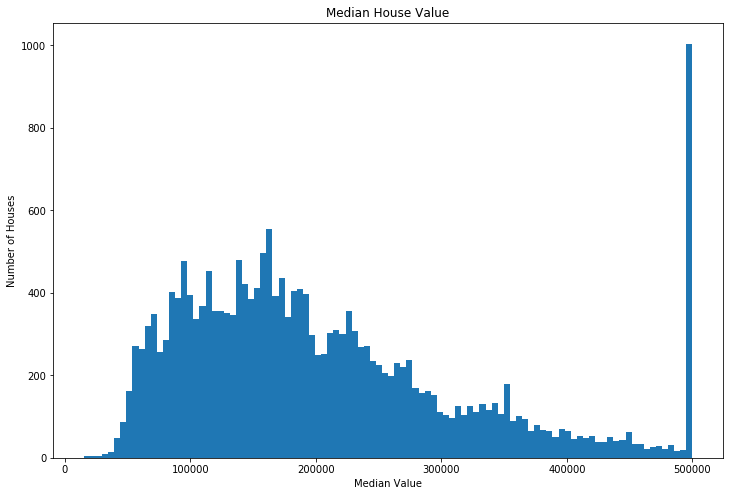

In [30]:
#graphic representation of the distribution of the median house value
plt.figure(figsize=(12,8))
df_ca['median_house_value'].plot(kind='hist', bins=100)
plt.title('Median House Value')
plt.xlabel('Median Value')
plt.ylabel('Number of Houses')
plt.show()

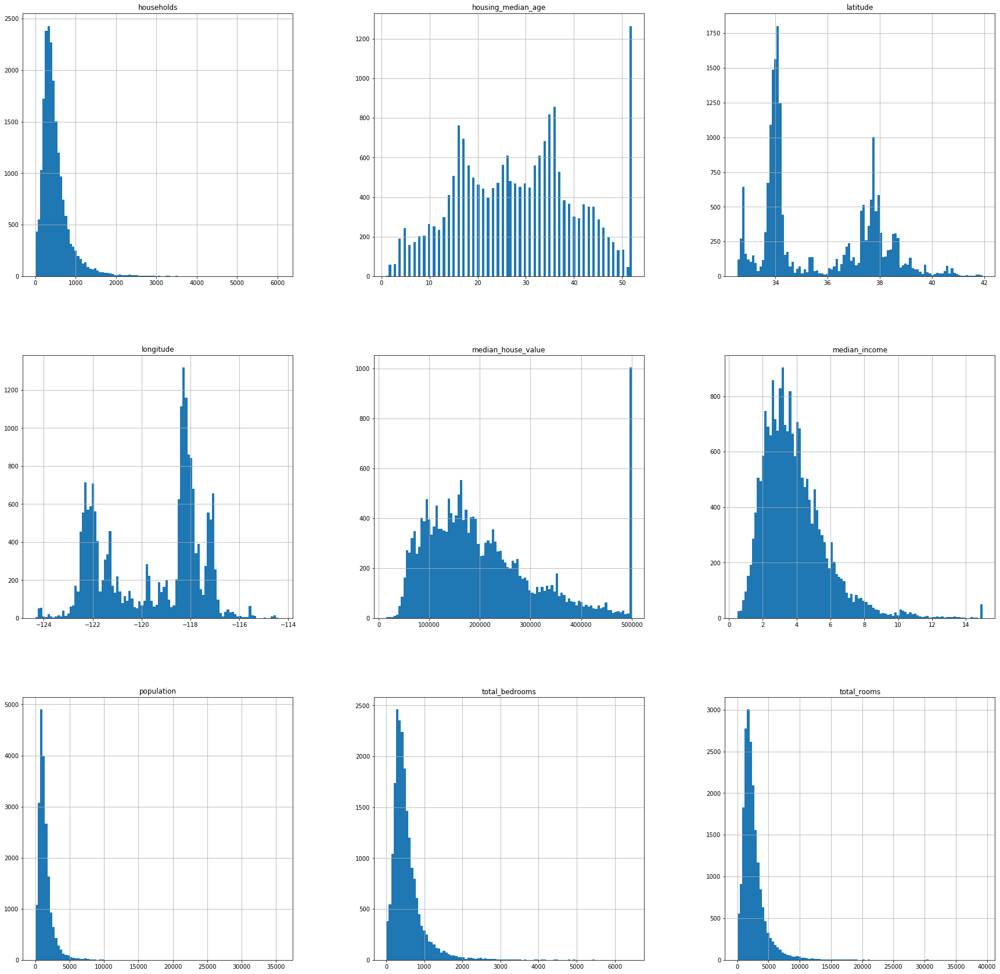

In [31]:
#histograms of the numerical features
df_ca.hist(figsize=(30,30), bins=100)
plt.show()

In [32]:
#correletion between predictors and average house value
cor = df_ca.corr()
cor.style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924616,-0.109357,0.045480,0.069608,0.100270,0.056513,-0.015550,-0.045398
latitude,-0.924616,1.000000,0.011899,-0.036667,-0.066983,-0.108997,-0.071774,-0.079626,-0.144638
housing_median_age,-0.109357,0.011899,1.000000,-0.360628,-0.320451,-0.295787,-0.302768,-0.118278,0.106432
total_rooms,0.045480,-0.036667,-0.360628,1.000000,0.930380,0.857281,0.918992,0.197882,0.133294
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.100270,-0.108997,-0.295787,0.857281,0.877747,1.000000,0.907186,0.005087,-0.025300
households,0.056513,-0.071774,-0.302768,0.918992,0.979728,0.907186,1.000000,0.013434,0.064894
median_income,-0.015550,-0.079626,-0.118278,0.197882,-0.007723,0.005087,0.013434,1.000000,0.688355
median_house_value,-0.045398,-0.144638,0.106432,0.133294,0.049686,-0.025300,0.064894,0.688355,1.000000


In [33]:
#description of our datasets
df_ca.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000
mean,-119.570689,35.633221,28.633094,2636.504233,537.870553,1424.946949,499.433465,3.871162,206864.413155
std,2.003578,2.136348,12.591805,2185.269567,421.385070,1133.208490,382.299226,1.899291,115435.667099
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1450.000000,296.000000,787.000000,280.000000,2.563700,119500.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.536500,179700.000000
75%,-118.010000,37.720000,37.000000,3143.000000,647.000000,1722.000000,604.000000,4.744000,264700.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [34]:
# categorical variables
df_ca['ocean_proximity'].value_counts()

<1H OCEAN     9034
INLAND        6496
NEAR OCEAN    2628
NEAR BAY      2270
ISLAND           5
Name: ocean_proximity, dtype: int64

In [35]:
#creating dummies for the categorical variable values
df_ca = pd.get_dummies(df_ca,drop_first = True)

In [36]:
df_ca = df_ca.drop('ocean_proximity_ISLAND', 1)

In [37]:
df_ca.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_INLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,1,0


In [38]:
#dividing the datasets into predictors and 'median house value'
X = df_ca.drop('median_house_value', axis=1)
Y = df_ca['median_house_value']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=26)

In [39]:
#features
print('train set shape: ',x_train.shape)
print('test set shape: ', x_test.shape)

train set shape:  (16346, 11)
test set shape:  (4087, 11)


In [40]:
#value
print('train set shape: ', y_train.shape)
print('test set shaoe: ', y_test.shape)

train set shape:  (16346,)
test set shaoe:  (4087,)


In [41]:
#loading and valuating Linear Regression, Decision Treen Regressor, K Neighbors Regressor and Random Forest Regressor
models = []
models.append(('Linear Regression', LinearRegression()))
models.append(('Decision Trees', DecisionTreeRegressor()))
models.append(('K Nearest Neighbor',KNeighborsRegressor()))
models.append(('Random Forest Regressor', RandomForestRegressor()))
results = []
names = []
for i, j in models: 
    k = KFold(n_splits=10 , random_state=42)
    result = cross_val_score(j, x_train,y_train, cv=k, scoring='r2')
    results.append(result)
    names.append(i)
    print('Model: ', i,'Score: %.2f' % result.mean(), "Model's Standard Deviation: %.2f" % result.std())

Model:  Linear Regression Score: 0.64 Model's Standard Deviation: 0.02
Model:  Decision Trees Score: 0.62 Model's Standard Deviation: 0.03
Model:  K Nearest Neighbor Score: 0.24 Model's Standard Deviation: 0.03
Model:  Random Forest Regressor Score: 0.82 Model's Standard Deviation: 0.01


Text(0.5, 0, 'Model')

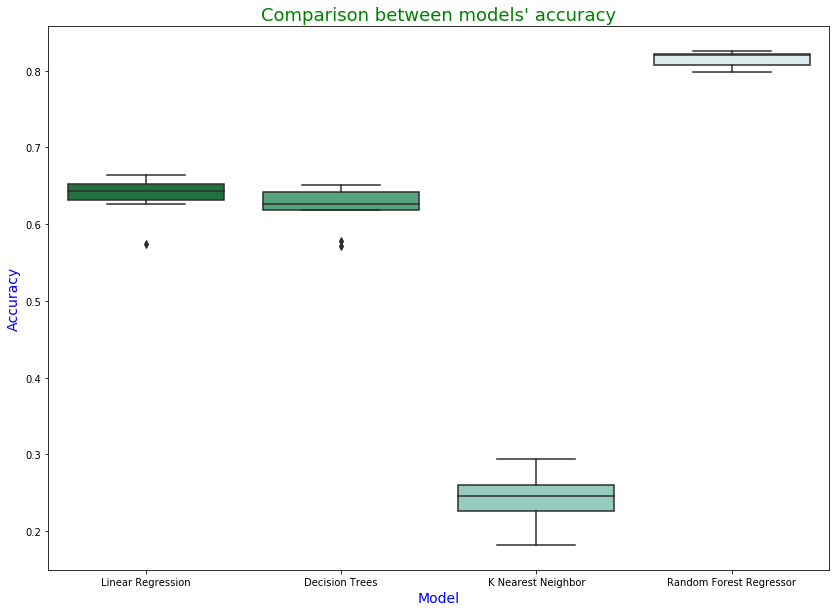

In [42]:
#graphic representation of the accuracy of every model used for regression
f,ax = plt.subplots(figsize = (14,10))
sns.boxplot(x=names, y=results,palette='BuGn_r')
plt.title("Comparison between models' accuracy", fontsize=18, color='green')
plt.ylabel('Accuracy', fontsize=14,color='blue')
plt.xlabel('Model',fontsize=14,color='blue')

In [43]:
#fitting the best performing model with the training set and predicting prices for the test set
RF = RandomForestRegressor()
RF.fit(x_train,y_train)

yhat = RF.predict(x_test)
print('Accuracy of the model: %.2f' % r2_score(y_test, yhat))

Accuracy of the model: 0.84


In [44]:
#joining the test dataset with the actual values and the predictions
df = pd.DataFrame({'avg_price': y_test, 'pred': yhat})
df1 = pd.DataFrame(x_test)
df_pred = df1.join(df)

In [45]:
#creating a column with the difference between the 'average house values' and the 'predicted house values'
df_pred['error'] = df_pred['avg_price']- df_pred['pred']


In [46]:
#selecting only the cases where the difference between predictions and actual values is less than 10000
df_co = df_pred[ (df_pred['error'] < 10000) & (df_pred['error']>-10000)]

In [47]:
#reppresentation on the California map of the houses from the test set with difference 
#between real prices and predicted value less than 10000 
latitude = 36.778259
longitude = -119.417931
CA_map= folium.Map(location=[latitude, longitude], zoom_start=6)


houses = folium.map.FeatureGroup()
for lat, lng, in zip(df_co.latitude, df_co.longitude):
    houses.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color='yellow',
            fill=True,
            fill_color='green',
            fill_opacity=0.6
            )
    )
CA_map.add_child(houses)    
